# Style transfer no pytorch

3 camadas a mais de convolução, por isso vgg19 se difere do vgg16,

rede treinada, e sair o pixel

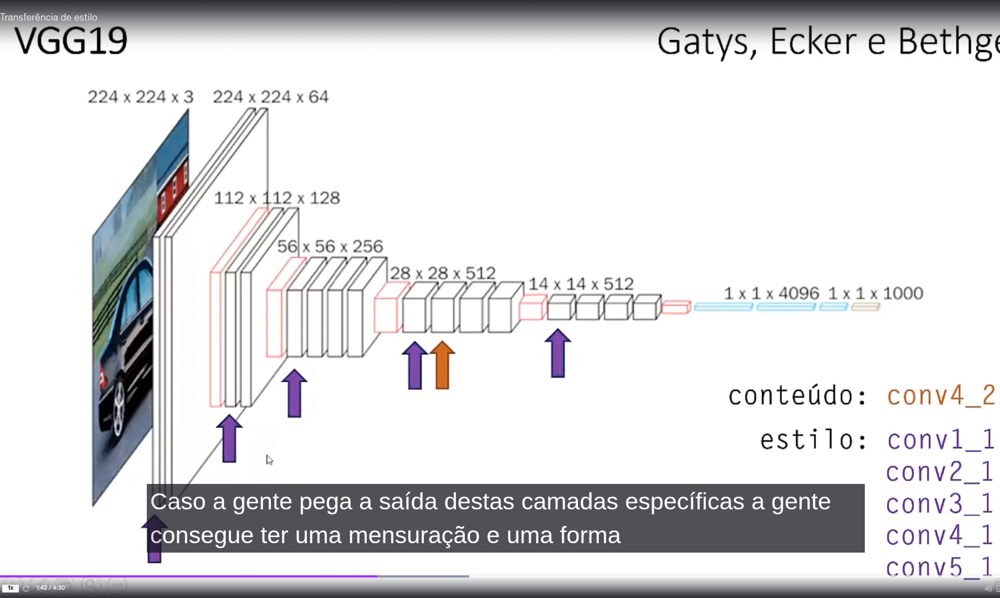

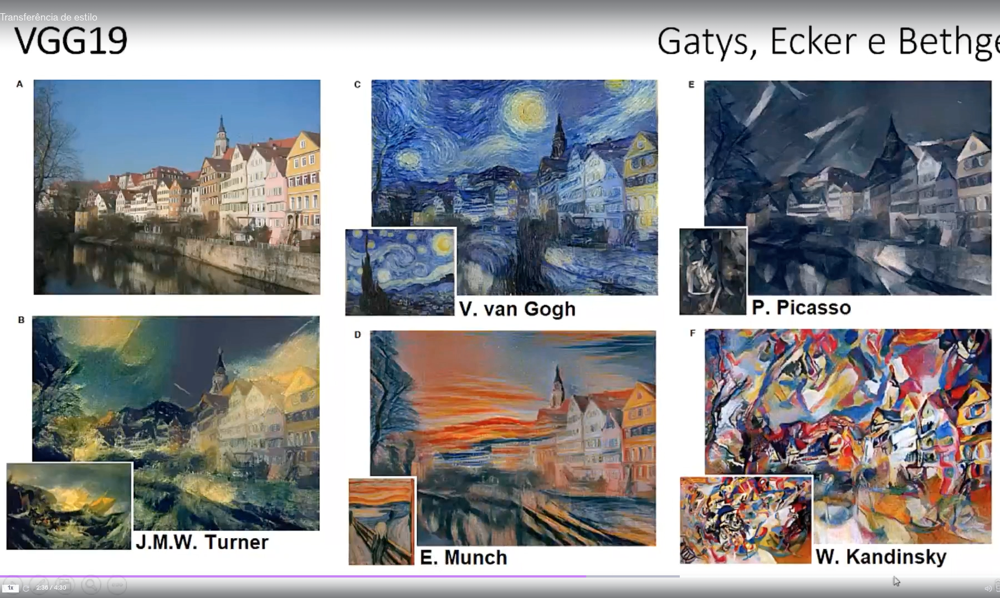

# Projeto 24: Transferência de estilo

In [1]:
# Style transfer no pytorch



## 1. Carregando dependências

In [2]:
# --- IMPORTAÇÃO DE BIBLIOTECAS E CONFIGURAÇÃO ---

# PIL (Python Imaging Library): Usada para abrir, manipular e salvar diferentes formatos de arquivo de imagem.
from PIL import Image

# Matplotlib: Biblioteca para visualização de dados; aqui serve para exibir as imagens na tela.
import matplotlib.pyplot as plt

# Numpy: Fundamental para computação científica, usada para manipular as imagens como matrizes numéricas.
import numpy as np

# PyTorch: O "motor" de Deep Learning.
import torch

# Optim: Contém algoritmos de otimização (como Adam ou LBFGS) para atualizar os pixels da imagem.
import torch.optim as optim

# MSE Loss (Mean Squared Error): Função de perda que calcula a diferença quadrática média entre imagens.
from torch.nn.functional import mse_loss

# Transforms e Models:
# Transforms: Para redimensionar e converter imagens em Tensores (formato que a GPU entende).
# Models: Para carregar redes neurais famosas já treinadas pelo Google/Oxford (como a VGG19).
from torchvision import transforms, models

# Datetime: Geralmente usada para criar timestamps em logs ou salvar arquivos com data/hora.
from datetime import datetime

# --- REPRODUTIBILIDADE ---

# Define uma "semente" fixa para os geradores de números aleatórios.
# Isso garante que, se você rodar o código de novo, os resultados iniciais sejam idênticos.
torch.manual_seed(124)

## 2. Carregando e preparando o modelo

In [3]:
# Carrega a arquitetura da rede neural VGG19.
# pretrained=True: Faz o download dos pesos (parâmetros) que já foram treinados
# pelo grupo de Oxford na base de dados ImageNet (milhões de imagens).

In [4]:
model = models.vgg19(pretrained = True) # parâmetros treinados e calibrados

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:04<00:00, 119MB/s]


In [5]:
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

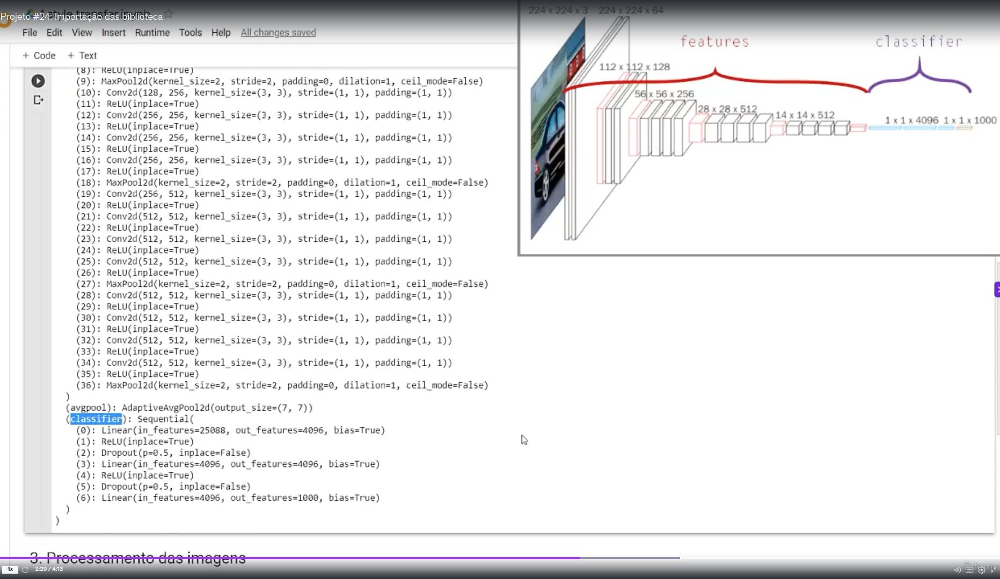

In [6]:
# para obter apenas as features
model = model.features

In [7]:
model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [8]:
# Itera por todos os parâmetros (pesos e bias) de todas as camadas do modelo VGG19.
for param in model.parameters():
    # Define que esses parâmetros NÃO precisam de cálculo de gradiente.
    # Isso significa que, durante o treinamento, esses pesos não serão atualizados.
    param.requires_grad = False
   # não atualizar os  parâmetros, pausar

In [9]:
# passar o modelo para o gpu
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device) # 16 fetures e convolução

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## 3. Processamento das imagens

imagem de formação de conteúdo e outra imagem de estilo.

In [10]:
!wget https://pbs.twimg.com/profile_images/923692524866297866/KvymiJuq_400x400.jpg
!wget https://jornal.usp.br/wp-content/uploads/O-Mamoeiro2.jpg

--2026-05-07 21:27:52--  https://pbs.twimg.com/profile_images/923692524866297866/KvymiJuq_400x400.jpg
Resolving pbs.twimg.com (pbs.twimg.com)... 151.101.76.159, 2a04:4e42:12::159
Connecting to pbs.twimg.com (pbs.twimg.com)|151.101.76.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25149 (25K) [image/jpeg]
Saving to: ‘KvymiJuq_400x400.jpg’

KvymiJuq_400x400.jp 100%[===================>]  24.56K  --.-KB/s    in 0.002s  

2026-05-07 21:27:52 (11.9 MB/s) - ‘KvymiJuq_400x400.jpg’ saved [25149/25149]

--2026-05-07 21:27:52--  https://jornal.usp.br/wp-content/uploads/O-Mamoeiro2.jpg
Resolving jornal.usp.br (jornal.usp.br)... 200.144.235.134
Connecting to jornal.usp.br (jornal.usp.br)|200.144.235.134|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2026-05-07 21:27:54 ERROR 403: Forbidden.



Imagem no disco virtual

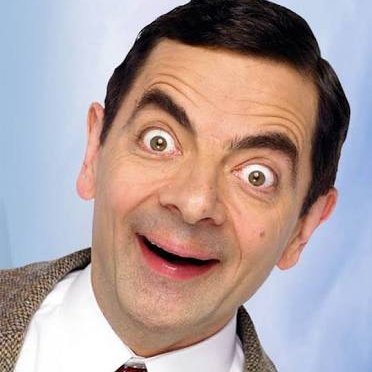

In [11]:
new_img = Image.open('/content/KvymiJuq_400x400.jpg')
new_img # coleta da imagem

In [12]:
#!wget https://jornal.usp.br/wp-content/uploads/O-Mamoeiro2.jpg
!wget --user-agent="Mozilla/5.0" https://jornal.usp.br/wp-content/uploads/O-Mamoeiro2.jpg

--2026-05-07 21:27:54--  https://jornal.usp.br/wp-content/uploads/O-Mamoeiro2.jpg
Resolving jornal.usp.br (jornal.usp.br)... 200.144.235.134
Connecting to jornal.usp.br (jornal.usp.br)|200.144.235.134|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 84821 (83K) [image/jpeg]
Saving to: ‘O-Mamoeiro2.jpg’

O-Mamoeiro2.jpg     100%[===================>]  82.83K   144KB/s    in 0.6s    

2026-05-07 21:27:56 (144 KB/s) - ‘O-Mamoeiro2.jpg’ saved [84821/84821]



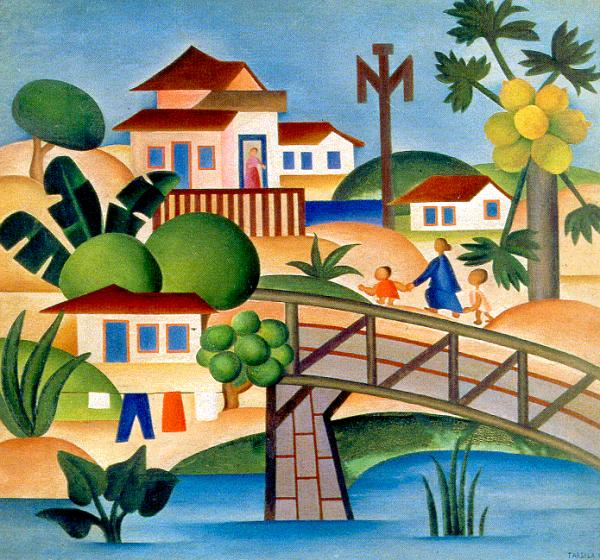

In [13]:
style_img = Image.open('O-Mamoeiro2.jpg')
style_img # imagem para o estilo, image da tarcila do amaral

In [14]:
# compose encadeia várias transformações.

# --- CONFIGURAÇÃO DO PIPELINE DE TRANSFORMAÇÃO ---

# transforms.Compose: Junta várias transformações em uma única variável 'transform'
transform = transforms.Compose([

    # 1. Redimensiona a imagem para que o seu menor lado tenha 300 pixels.
    # Isso padroniza o tamanho e evita que imagens gigantescas estourem a memória da GPU.
    transforms.Resize(300), # altura 300 pixel, a largura ajustada automaticamente, diminuir a figura.

    # 2. Converte a imagem (que está no formato PIL ou matriz normal de 0 a 255)
    # em um Tensor do PyTorch, alterando a escala dos pixels para o intervalo de 0.0 a 1.0.
    transforms.ToTensor(),

    # 3. Normaliza os canais de cor (R, G, B) utilizando a média e o desvio padrão.
    # Os valores ((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)) são o padrão do ImageNet.
    transforms.Normalize((0.485, 0.456, 0.406), # fila média Red Green Blue
                         (0.229, 0.224, 0.225)) # fila desvio padrão Red Green Blue
])  # média por ou divide por desvio padrão
# cores de tentativa e erro.
# Red Green Blue


In [15]:
# aplicar a transformação na imagem inicial da pessoa

new_img = transform(new_img)

In [16]:
# ver o formato do objeto
print('shape:',new_img.shape)
print()
new_img

shape: torch.Size([3, 300, 300])



tensor([[[ 0.7248,  0.7248,  0.7248,  ...,  1.1187,  1.1187,  1.1358],
         [ 0.7248,  0.7248,  0.7248,  ...,  1.1187,  1.1187,  1.1358],
         [ 0.7248,  0.7248,  0.7248,  ...,  1.1187,  1.1187,  1.1358],
         ...,
         [ 0.4679,  0.2796,  0.1426,  ...,  0.3481,  0.3138,  0.2967],
         [ 0.1768,  0.3138,  0.4508,  ...,  0.3138,  0.2796,  0.2624],
         [-0.0287,  0.2453,  0.9303,  ...,  0.2967,  0.2624,  0.2624]],

        [[ 1.3431,  1.3431,  1.3431,  ...,  1.5357,  1.5357,  1.5532],
         [ 1.3431,  1.3431,  1.3431,  ...,  1.5357,  1.5357,  1.5532],
         [ 1.3431,  1.3431,  1.3431,  ...,  1.5357,  1.5357,  1.5532],
         ...,
         [ 0.3102,  0.1176, -0.0224,  ...,  0.9930,  0.9930,  0.9755],
         [ 0.0301,  0.1702,  0.2927,  ...,  0.9580,  0.9580,  0.9405],
         [-0.1800,  0.1001,  0.7829,  ...,  0.9405,  0.9405,  0.9405]],

        [[ 2.0648,  2.0648,  2.0648,  ...,  2.2914,  2.2914,  2.3088],
         [ 2.0648,  2.0648,  2.0648,  ...,  2

forçar a imagem do estilo ter o mesmo formato da imagem new_img que é de shape: torch.Size([3, 300, 300])


In [17]:
shape = new_img.shape[1:]
shape

torch.Size([300, 300])

In [18]:
transform = transforms.Compose([
    # 1. Redimensiona a imagem para o tamanho definido na variável 'shape'.
    # Isso garante que as imagens de conteúdo e estilo tenham dimensões compatíveis.
    transforms.Resize(shape),

    # 2. Converte a imagem de um formato PIL (0-255) para um Tensor PyTorch (0.0-1.0).
    # Além disso, reorganiza os dados para o formato [Canais, Altura, Largura].
    transforms.ToTensor(),

    # 3. Normaliza as cores usando a média e o desvio padrão do dataset ImageNet.
    # Isso coloca os dados na mesma escala estatística que a rede VGG19 foi treinada.
    transforms.Normalize((0.485, 0.456, 0.406),
                         (0.229, 0.224, 0.225))
]) # recriar a transformação, forçando a figura de estilo a ter o mesmo formato da figura que desejamos mudar.

In [19]:
style_img = transform(style_img)

In [20]:
style_img.shape # figura no mesmo formato

torch.Size([3, 300, 300])

In [21]:
# dimensão de batch

In [22]:
# Adiciona uma dimensão extra na posição 0 (início) do Tensor.
# Transforma a imagem de [Canais, Altura, Largura] para [1, Canais, Altura, Largura].
new_img = new_img.unsqueeze(0)
style_img = style_img.unsqueeze(0)

# Verifica as novas dimensões das imagens.
# O output esperado será algo como: (torch.Size([1, 3, 300, 300]), torch.Size([1, 3, 300, 300]))
new_img.shape, style_img.shape

(torch.Size([1, 3, 300, 300]), torch.Size([1, 3, 300, 300]))

Essa função é o "caminho de volta". Enquanto o pipeline anterior preparava a imagem para a IA ler, esta função prepara o Tensor (matriz numérica) para que um ser humano consiga vê-la como uma imagem normal novamente.

In [23]:
# função para visualizar as imagens

def show_img(img):
    # 1. Tira da GPU (.cpu), cria uma cópia (.clone), remove do histórico de cálculo (.detach) (retira o gradiente),
    # converte para array do Numpy (.numpy) e remove a dimensão de lote de 1 (.squeeze).
    img = img.cpu().clone().detach().numpy().squeeze()

    # 2. Reorganiza as dimensões: de [Canais, Altura, Largura] para [Altura, Largura, Canais].
    # O PyTorch usa Canais primeiro, mas o Matplotlib/OpenCV usa Canais por último.
    img = img.transpose(1, 2, 0)

    # 3. DESNORMALIZAÇÃO: Multiplica pelo desvio padrão e soma a média.
    # Isso desfaz o 'transforms.Normalize' feito anteriormente para restaurar as cores originais.
    img = img * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    # multiplica a imagem pelo desvio padrão e soma com a média.

    # 4. Garante que os valores fiquem entre 0 e 1.
    # Devido a arredondamentos matemáticos, alguns pixels podem sair desse intervalo, o que causaria erro na exibição.
    img = img.clip(0, 1) # o pixel tem que ter o valor entre 0 e 1

    return img



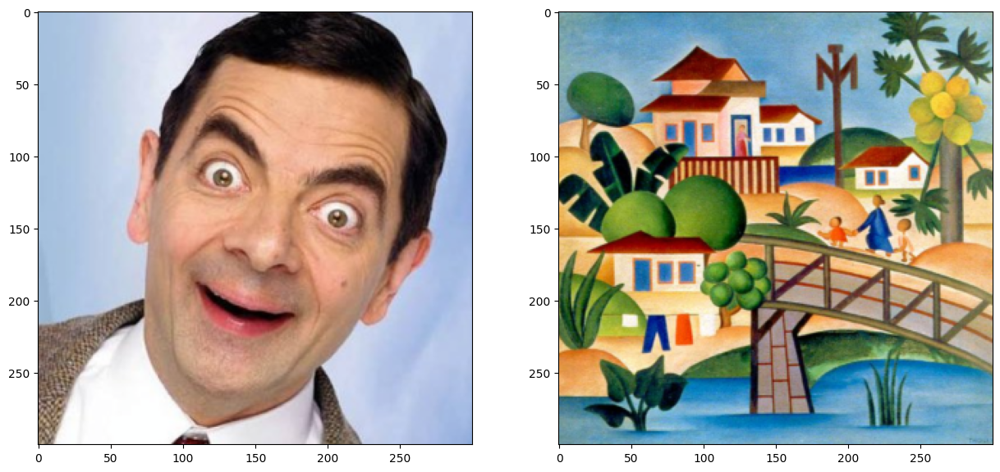

In [24]:
fig, ax = plt.subplots(1, 2, figsize = (15, 10)) # vamos visualizar as imagens, que serão usadas no procedimento
ax[0].imshow(show_img(new_img))
ax[1].imshow(show_img(style_img))

# criação da rede neural aula 3

## 4. Preparação da estrutura de rede

In [25]:
model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

o modelo pode ser dividido em 5 step de convoluções, conforme mostra abaixo


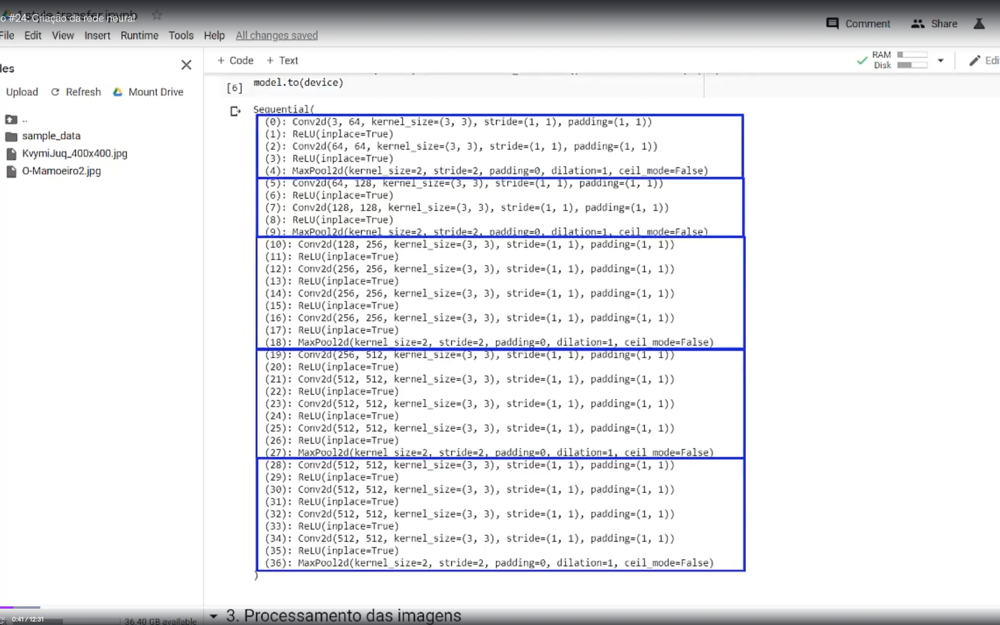

são features de conteúdo e de estilo, nas divisões acima

o step que coleta o conteúdo é o step 4, número 21

os que coletam as características são o 0, 5,10,19 e 28, em amarelo

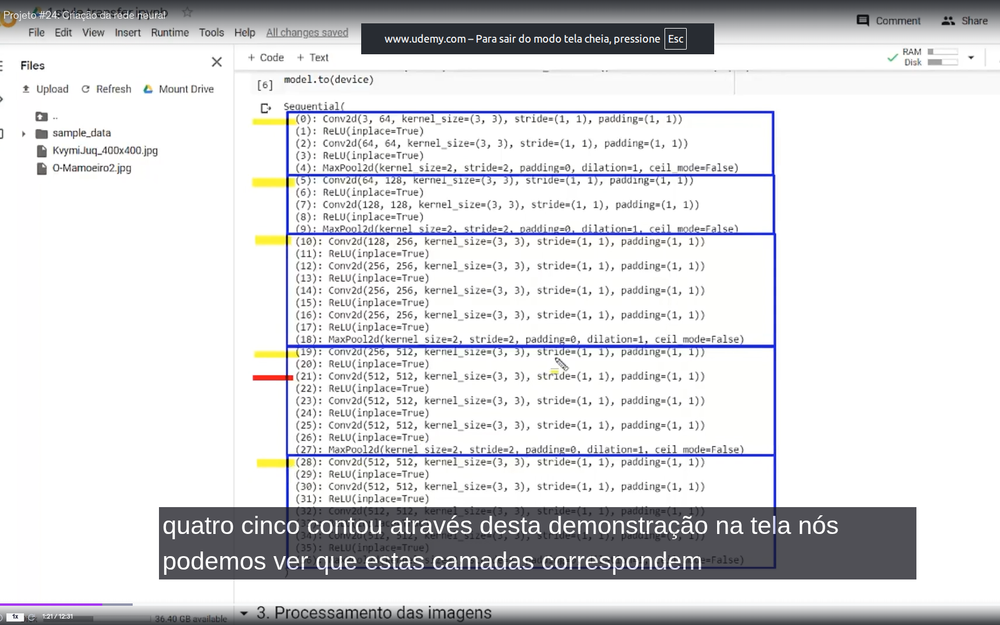

Esta função é o "extrator" que permite espiar dentro do cérebro da rede neural VGG19 para ver como ela está interpretando a imagem em diferentes níveis de profundidade.

In [34]:
# --- FUNÇÃO EXTRATORA DE CARACTERÍSTICAS ---

def extract_features(image):
    # 1. Define as camadas específicas que queremos "interceptar".
    # Camadas iniciais (0, 5) pegam texturas e cores.
    # Camadas profundas (21, 28) pegam formas complexas e objetos.
    layers = [0, 5, 10, 19, 21, 28] # features que serão armazenados em dicionário
    # 21 do conteúdo

    # Dicionário para guardar as representações visuais (filtros) de cada camada.
    features = {}

    # 2. Faz a imagem passar pelas camadas da rede (Feedforward).
    # O loop vai até 37 porque a VGG19 tem cerca de 37 blocos de processamento.
    for n in range(37):
        # A imagem passa pela camada 'n' e o resultado vira a entrada da próxima.
        image = model[n](image)

        # 3. Se a camada atual estiver na nossa lista de interesse, guardamos o resultado.
        if n in layers:
            features[n] = image

    # Retorna o dicionário com os "mapas de características" (feature maps).
    return features

In [27]:
# passar a imagem para a gpu
new_img, style_img = new_img.to(device), style_img.to(device)

In [28]:
# para o modelo usar a imagem

In [29]:
# --- MAPEAMENTO DE CARACTERÍSTICAS (FEATURE MAPPING) ---

# 1. Extrai os mapas de ativação da imagem que está sendo gerada (new_img).
# Isso servirá para comparar se ela está mantendo o conteúdo original.
new_img_features = extract_features(new_img)

# 2. Extrai os mapas de ativação da imagem de referência artística (style_img).
# Isso servirá para capturar as texturas, cores e padrões do artista.
style_img_features = extract_features(style_img)



- determinar a perda da imagem que esta sendo gerada e a imagem de estilo

baseado em tensor,

In [32]:
# transferir

# --- FUNÇÃO PARA CALCULAR A MATRIZ DE GRAM ---

def gram_matrix(tensor):
    # 1. Extrai as dimensões do tensor:
    # b: batch (lote), c: canais (cores/filtros), h: altura, w: largura.
    b, c, h, w = tensor.size() # metódo size no tensor

    # 2. Achata (reshape) as dimensões de altura e largura.
    # O tensor passa de [C, H, W] para uma matriz de [C, H*W].
    # Agora, cada linha é um canal (filtro) e cada coluna é um pixel.
    # uma imagem por vez, batch =1
    tensor = tensor.view(c, h * w)

    # 3. Multiplicação de Matriz (torch.mm):
    # Multiplica a matriz pelo seu próprio transposto (.t()).
    # Isso calcula a correlação entre todos os canais da rede neural.
    gram_matrix = torch.mm(tensor, tensor.t()) # tensor e transposto

    # Retorna a matriz que representa a "essência estatística" do estilo.
    return gram_matrix

In [33]:
# feature de estilo que será usado na função gram_matrix

# --- CÁLCULO DAS MATRIZES DE GRAM PARA O ESTILO ---

# Para cada camada (layer) que guardamos no dicionário 'style_img_features':
# 1. Pegamos o mapa de características dessa camada.
# 2. Passamos pela função gram_matrix() para calcular as correlações de estilo.
# 3. Guardamos o resultado em um novo dicionário chamado 'style_img_grams'.

style_img_grams = {layer: gram_matrix(style_img_features[layer]) for layer in style_img_features}



In [35]:
style_img_features

{0: tensor([[[[0.0000, 0.0604, 0.1535,  ..., 0.7553, 0.7306, 0.3710],
           [0.0000, 0.1456, 0.2304,  ..., 0.6695, 0.6584, 0.4027],
           [0.0000, 0.1438, 0.2438,  ..., 0.7177, 0.7131, 0.4287],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.2237, 0.3270, 0.0038],
           [0.0000, 0.0000, 0.0000,  ..., 0.2654, 0.3581, 0.0870],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.1491, 0.7656, 0.6603,  ..., 1.4234, 1.4902, 3.0405],
           [0.0000, 0.3126, 0.2243,  ..., 0.3257, 0.3107, 2.9893],
           [0.0000, 0.0787, 0.1320,  ..., 0.3524, 0.2025, 2.8586],
           ...,
           [0.0000, 0.4685, 0.2067,  ..., 0.0000, 0.7204, 1.7185],
           [0.0000, 0.5560, 0.4256,  ..., 0.0000, 0.6940, 2.1256],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.3897]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0

In [36]:
style_img_grams

{0: tensor([[ 16958.0879,  12116.9053,  14401.8613,  ...,  15313.2217,
            4635.8838,  12411.9609],
         [ 12116.9053, 138574.9062,  12123.0166,  ...,  26028.2168,
           15482.2773,  44502.2500],
         [ 14401.8613,  12123.0166,  32671.0605,  ...,    252.2623,
            7834.7070,  16904.1133],
         ...,
         [ 15313.2217,  26028.2168,    252.2623,  ..., 149028.2344,
           18781.6895,  36363.6953],
         [  4635.8838,  15482.2773,   7834.7070,  ...,  18781.6895,
           25566.9531,  14812.2803],
         [ 12411.9609,  44502.2500,  16904.1133,  ...,  36363.6953,
           14812.2803,  87751.3359]]),
 5: tensor([[ 71357.1250,   5161.4458,  27765.1250,  ...,  29473.1484,
           11483.1572,  23411.5723],
         [  5161.4458,  30875.2383,   7774.5962,  ...,  46245.1445,
           15943.8027,   8019.3008],
         [ 27765.1250,   7774.5962,  64764.0977,  ...,  23990.9844,
            7582.0635,  24946.6504],
         ...,
         [ 29473.15

In [37]:
# --- PESOS DE ESTILO (STYLE WEIGHTS) ---

style_weights = {
    0: 1.0,   # Camada inicial: Peso máximo para texturas finas, bordas e cores pontuais.
    5: 0.8,   # Camada levemente profunda: Foca em padrões e hachuras.
    10: 0.6,  # Camada intermediária: Começa a focar em formas geométricas menores.
    19: 0.4,  # Camada profunda: Foca em arranjos espaciais de cores.
    28: 0.2   # Camada muito profunda: Peso menor para estruturas muito grandes e abstratas.
}

In [40]:
#(0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
#(5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
#(10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
#(19): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
#(21): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
#(28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [39]:
#Índice|	Nome Técnico	    |	O que ela faz no Estilo/Conteúdo
#(0)	|	Conv2d(3, 64...)	  |	A primeira porta de entrada. Ela vê os pixels brutos e detecta bordas muito finas e cores básicas. Por isso o peso é 1.0 (estilo puro).
#(5)	|	Conv2d(64, 128...)	|	Logo após o primeiro MaxPool. Aqui a rede já "limpou" o ruído e foca em texturas mais complexas.
#(10)	|	Conv2d(128, 256...)	|	Início do terceiro bloco. Começa a identificar padrões repetitivos (pinceladas médias).
#(19)	|	Conv2d(256, 512...)	|	Início do quarto bloco. Aqui o estilo se torna mais abstrato e focado em grandes áreas de cor.
#(21)	|	Conv2d(512, 512...)	|	A Camada de Conteúdo. Note que ela está no meio do bloco 4. Ela é perfeita para o conteúdo porque
#                           | tem filtros suficientes para saber que "ali é um olho", mas não é tão profunda a ponto de perder a forma original.
#(28)	|	Conv2d(512, 512...)	|	Início do último bloco. Vê apenas a "vibe" geral da imagem. É usada para garantir que o estilo global (como iluminação) seja transferido.


In [38]:
# Peso do Conteúdo (Baixo)
content_weight = 1

# Peso do Estilo (Muito Alto: 1.000.000)
style_weight = 1e6 # multiplicação

In [42]:
# duas preparações gerais, imagem fundida

# imagem pura sem aplicar o estilo ainda
# já sai na forma de tensor
# manter as transformações matemáticas na base

# --- CRIAÇÃO DA IMAGEM DE TREINAMENTO ---

# 1. .clone(): Cria uma cópia exata da imagem de conteúdo (new_img).
# Começamos com a foto original e vamos "pintando" o estilo por cima dela.

# 2. .requires_grad_(True): Este é o ponto CHAVE.
# Ao contrário do modelo (que congelamos), aqui dizemos ao PyTorch que
# QUEREMOS calcular as derivadas (gradientes) para esta imagem.
# Isso permite que o algoritmo altere os PIXELS da imagem para reduzir o erro.

# 3. .to(device): Envia a imagem para a GPU (se disponível) ou CPU.
# Para que o cálculo seja rápido, a imagem e o modelo devem estar no mesmo lugar.

target_img = new_img.clone().requires_grad_(True).to(device)


In [45]:
# modelo está congelado, estamos alterando a imagem, alvo ou target

In [44]:
# alterar a imagem alvo
# --- CONFIGURAÇÃO DO OTIMIZADOR ---

# optim.Adam: É o algoritmo "Adam", um dos mais eficientes para Deep Learning.
# Ele ajusta os pixels de forma inteligente, sendo rápido e estável.

# [target_img]: Aqui se diz ao Adam: "Sua única tarefa é alterar os pixels
# desta imagem". Note que NÃO passamos os parâmetros do modelo (VGG),
# pois a rede neural está congelada.

# lr = 0.002: É o 'Learning Rate' (Taxa de Aprendizagem).
# Ele define o tamanho do "passo" que o otimizador dá a cada tentativa.
optimizer = optim.Adam([target_img], lr = 0.002)

## 5. Treinamento

In [ ]:
# ajuste da imagem alvo para o estilo

a Gram Matrix é como o "filtro de essência" da Inteligência Artificial. Enquanto uma imagem normal foca em onde as coisas estão (um olho aqui, uma árvore ali), a Gram Matrix foca em como a imagem se comporta estatisticamente.

Aqui está o que ela faz de forma simplificada:

1. Ela ignora a localização
Em uma foto de um gato, a rede neural sabe que o "triângulo" da orelha está no topo. Para a Gram Matrix, a posição não importa. Ela apenas registra: "esta imagem tem muitos triângulos e eles costumam ser alaranjados".

2. Ela mede correlações
Dentro da rede neural (VGG19), existem centenas de "filtros".

Filtro A: Detecta riscos verticais.

Filtro B: Detecta a cor azul marinho.

Gram Matrix multiplica esses filtros. Se, ao longo de toda a imagem, onde aparece o "Filtro A" também aparece o "Filtro B", a matriz terá um valor alto. Isso diz à IA: "O estilo desse artista envolve fazer riscos verticais em azul marinho".

3. A Matemática (em 3 passos simples)
Para calcular a Gram Matrix de uma camada da rede:

Achata (Flatten): Pegamos o mapa de características (que é 3D) e esticamos ele para virar uma tabela 2D.

Multiplica: Multiplicamos essa tabela por ela mesma (transposta).

Resultado: O que sobra é uma matriz quadrada que mostra como cada característica da rede se relaciona com todas as outras.


========================

Usamos a Gram Matrix porque ela permite que a IA capture a textura e o estilo de Tarsila do Amaral ou Van Gogh sem tentar desenhar "O Mamoeiro" ou "A Noite Estrelada" em cima da foto.

Ela tenta fazer com que a foto tenha as mesmas correlações de cores e texturas que o quadro original tinha.

Analogia: Se a imagem original é uma música, a Gram Matrix não captura a letra (conteúdo), ela captura o timbre dos instrumentos e o ritmo (estilo).



ÉPOCA 0001/3000 | perda conteúdo: 0.000 | perda estilo: 500.010 | perda TOTAL: 500010016.0
ÉPOCA 0002/3000 | perda conteúdo: 0.035 | perda estilo: 494.295 | perda TOTAL: 494295200.0
ÉPOCA 0003/3000 | perda conteúdo: 0.139 | perda estilo: 488.541 | perda TOTAL: 488540896.0
ÉPOCA 0004/3000 | perda conteúdo: 0.301 | perda estilo: 482.759 | perda TOTAL: 482759200.0
ÉPOCA 0005/3000 | perda conteúdo: 0.506 | perda estilo: 476.940 | perda TOTAL: 476940064.0
ÉPOCA 0006/3000 | perda conteúdo: 0.744 | perda estilo: 471.076 | perda TOTAL: 471075936.0
ÉPOCA 0007/3000 | perda conteúdo: 1.011 | perda estilo: 465.185 | perda TOTAL: 465185152.0
ÉPOCA 0008/3000 | perda conteúdo: 1.303 | perda estilo: 459.280 | perda TOTAL: 459280192.0
ÉPOCA 0009/3000 | perda conteúdo: 1.617 | perda estilo: 453.384 | perda TOTAL: 453383520.0
ÉPOCA 0010/3000 | perda conteúdo: 1.945 | perda estilo: 447.505 | perda TOTAL: 447504704.0
ÉPOCA 0011/3000 | perda conteúdo: 2.285 | perda estilo: 441.654 | perda TOTAL: 441653920.0

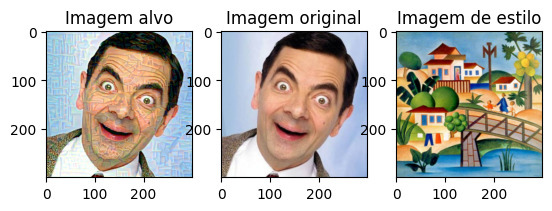

ÉPOCA 0501/3000 | perda conteúdo: 17.729 | perda estilo: 36.911 | perda TOTAL: 36910664.0
ÉPOCA 0502/3000 | perda conteúdo: 17.735 | perda estilo: 36.837 | perda TOTAL: 36836580.0
ÉPOCA 0503/3000 | perda conteúdo: 17.740 | perda estilo: 36.763 | perda TOTAL: 36762708.0
ÉPOCA 0504/3000 | perda conteúdo: 17.746 | perda estilo: 36.689 | perda TOTAL: 36689096.0
ÉPOCA 0505/3000 | perda conteúdo: 17.751 | perda estilo: 36.616 | perda TOTAL: 36615732.0
ÉPOCA 0506/3000 | perda conteúdo: 17.757 | perda estilo: 36.543 | perda TOTAL: 36542580.0
ÉPOCA 0507/3000 | perda conteúdo: 17.762 | perda estilo: 36.470 | perda TOTAL: 36469660.0
ÉPOCA 0508/3000 | perda conteúdo: 17.768 | perda estilo: 36.397 | perda TOTAL: 36396968.0
ÉPOCA 0509/3000 | perda conteúdo: 17.773 | perda estilo: 36.324 | perda TOTAL: 36324512.0
ÉPOCA 0510/3000 | perda conteúdo: 17.779 | perda estilo: 36.252 | perda TOTAL: 36252300.0
ÉPOCA 0511/3000 | perda conteúdo: 17.784 | perda estilo: 36.180 | perda TOTAL: 36180292.0
ÉPOCA 0512

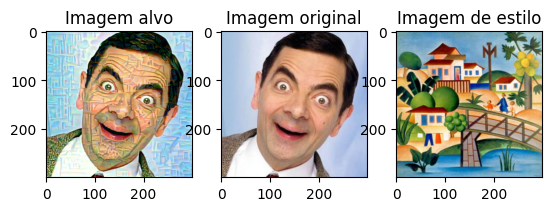

ÉPOCA 1001/3000 | perda conteúdo: 19.602 | perda estilo: 16.920 | perda TOTAL: 16920080.0
ÉPOCA 1002/3000 | perda conteúdo: 19.605 | perda estilo: 16.900 | perda TOTAL: 16900434.0
ÉPOCA 1003/3000 | perda conteúdo: 19.607 | perda estilo: 16.881 | perda TOTAL: 16880846.0
ÉPOCA 1004/3000 | perda conteúdo: 19.610 | perda estilo: 16.861 | perda TOTAL: 16861302.0
ÉPOCA 1005/3000 | perda conteúdo: 19.612 | perda estilo: 16.842 | perda TOTAL: 16841808.0
ÉPOCA 1006/3000 | perda conteúdo: 19.615 | perda estilo: 16.822 | perda TOTAL: 16822358.0
ÉPOCA 1007/3000 | perda conteúdo: 19.617 | perda estilo: 16.803 | perda TOTAL: 16802950.0
ÉPOCA 1008/3000 | perda conteúdo: 19.619 | perda estilo: 16.784 | perda TOTAL: 16783588.0
ÉPOCA 1009/3000 | perda conteúdo: 19.622 | perda estilo: 16.764 | perda TOTAL: 16764277.0
ÉPOCA 1010/3000 | perda conteúdo: 19.624 | perda estilo: 16.745 | perda TOTAL: 16745009.0
ÉPOCA 1011/3000 | perda conteúdo: 19.627 | perda estilo: 16.726 | perda TOTAL: 16725799.0
ÉPOCA 1012

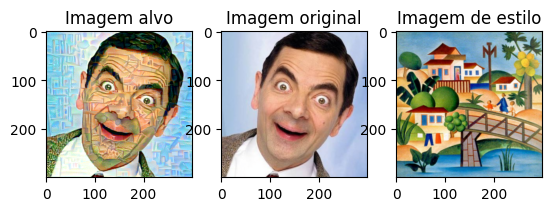

ÉPOCA 1501/3000 | perda conteúdo: 20.597 | perda estilo: 10.968 | perda TOTAL: 10967876.0
ÉPOCA 1502/3000 | perda conteúdo: 20.598 | perda estilo: 10.961 | perda TOTAL: 10960700.0
ÉPOCA 1503/3000 | perda conteúdo: 20.600 | perda estilo: 10.954 | perda TOTAL: 10953535.0
ÉPOCA 1504/3000 | perda conteúdo: 20.602 | perda estilo: 10.946 | perda TOTAL: 10946378.0
ÉPOCA 1505/3000 | perda conteúdo: 20.603 | perda estilo: 10.939 | perda TOTAL: 10939230.0
ÉPOCA 1506/3000 | perda conteúdo: 20.605 | perda estilo: 10.932 | perda TOTAL: 10932093.0
ÉPOCA 1507/3000 | perda conteúdo: 20.606 | perda estilo: 10.925 | perda TOTAL: 10924969.0
ÉPOCA 1508/3000 | perda conteúdo: 20.608 | perda estilo: 10.918 | perda TOTAL: 10917847.0
ÉPOCA 1509/3000 | perda conteúdo: 20.610 | perda estilo: 10.911 | perda TOTAL: 10910735.0
ÉPOCA 1510/3000 | perda conteúdo: 20.611 | perda estilo: 10.904 | perda TOTAL: 10903639.0
ÉPOCA 1511/3000 | perda conteúdo: 20.613 | perda estilo: 10.897 | perda TOTAL: 10896553.0
ÉPOCA 1512

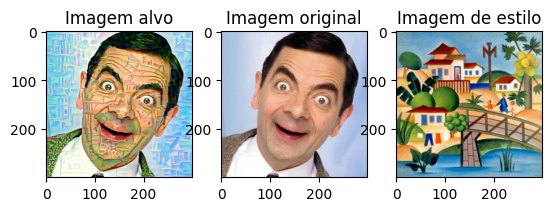

ÉPOCA 2001/3000 | perda conteúdo: 21.311 | perda estilo: 8.207 | perda TOTAL: 8206866.0
ÉPOCA 2002/3000 | perda conteúdo: 21.313 | perda estilo: 8.202 | perda TOTAL: 8202499.0
ÉPOCA 2003/3000 | perda conteúdo: 21.314 | perda estilo: 8.198 | perda TOTAL: 8198134.0
ÉPOCA 2004/3000 | perda conteúdo: 21.315 | perda estilo: 8.194 | perda TOTAL: 8193766.0
ÉPOCA 2005/3000 | perda conteúdo: 21.317 | perda estilo: 8.189 | perda TOTAL: 8189408.0
ÉPOCA 2006/3000 | perda conteúdo: 21.318 | perda estilo: 8.185 | perda TOTAL: 8185049.5
ÉPOCA 2007/3000 | perda conteúdo: 21.319 | perda estilo: 8.181 | perda TOTAL: 8180689.5
ÉPOCA 2008/3000 | perda conteúdo: 21.321 | perda estilo: 8.176 | perda TOTAL: 8176336.0
ÉPOCA 2009/3000 | perda conteúdo: 21.322 | perda estilo: 8.172 | perda TOTAL: 8171988.0
ÉPOCA 2010/3000 | perda conteúdo: 21.324 | perda estilo: 8.168 | perda TOTAL: 8167639.5
ÉPOCA 2011/3000 | perda conteúdo: 21.325 | perda estilo: 8.163 | perda TOTAL: 8163301.0
ÉPOCA 2012/3000 | perda conteúdo

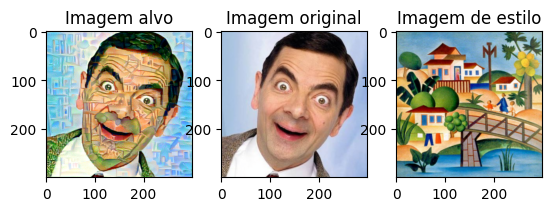

ÉPOCA 2501/3000 | perda conteúdo: 21.894 | perda estilo: 6.369 | perda TOTAL: 6368552.0
ÉPOCA 2502/3000 | perda conteúdo: 21.895 | perda estilo: 6.365 | perda TOTAL: 6365459.5
ÉPOCA 2503/3000 | perda conteúdo: 21.897 | perda estilo: 6.362 | perda TOTAL: 6362368.5
ÉPOCA 2504/3000 | perda conteúdo: 21.898 | perda estilo: 6.359 | perda TOTAL: 6359285.5
ÉPOCA 2505/3000 | perda conteúdo: 21.899 | perda estilo: 6.356 | perda TOTAL: 6356202.5
ÉPOCA 2506/3000 | perda conteúdo: 21.900 | perda estilo: 6.353 | perda TOTAL: 6353116.0
ÉPOCA 2507/3000 | perda conteúdo: 21.902 | perda estilo: 6.350 | perda TOTAL: 6350032.5
ÉPOCA 2508/3000 | perda conteúdo: 21.903 | perda estilo: 6.347 | perda TOTAL: 6346951.0
ÉPOCA 2509/3000 | perda conteúdo: 21.904 | perda estilo: 6.344 | perda TOTAL: 6343868.5
ÉPOCA 2510/3000 | perda conteúdo: 21.905 | perda estilo: 6.341 | perda TOTAL: 6340790.5
ÉPOCA 2511/3000 | perda conteúdo: 21.907 | perda estilo: 6.338 | perda TOTAL: 6337715.5
ÉPOCA 2512/3000 | perda conteúdo

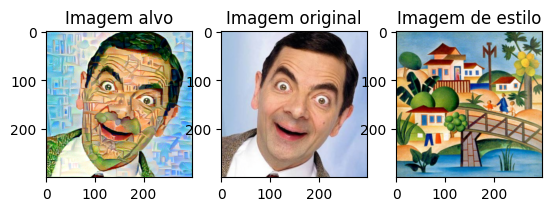

Processo demorou 2:10:51.292822


In [46]:
epochs = 3000 # O processo será repetido 3.000 vezes.
print_every = 500 # Para imprimir as variáveis os resultados parciais, a cada 500 épocas
start = datetime.now() # gravar o momento que o processo começou
for epoch in range(epochs):
    # Extrai as características da imagem que estamos tentando criar (target_img)
    target_img_features = extract_features(target_img) # imagem alvo a ser mudado

    # Perda ao conteúdo
    #Cálculo da Perda de Conteúdo (Content Loss)
    target_img_content_features = target_img_features[21] # o que gera o feature de conteúdo (função 21)
    new_img_content_features = new_img_features[21] # conteúdo recuperado
    # O mse_loss mede a diferença "quadrática média" entre as duas
    content_loss = mse_loss(target_img_content_features, new_img_content_features) # erro médio quadrado MSE (Mean Squared Error ou Erro Quadrático Médio)
    #Aqui a IA pergunta: "O quão diferente o desenho desta imagem está da foto original?". Usamos a camada 21 porque ela foca nos objetos e formas, não nas cores.

    # Perda ao estilo (Style Loss)
    # perda pelas 5 camadas
    #    layers = [0, 5, 10, 19, 28]
    style_loss = 0
    for layer in style_weights:
        target_img_feature = target_img_features[layer] # recuperar o feature correspondente
        _, c, h, w = target_img_feature.shape # salvar os formatos dos features
        target_img_gram = gram_matrix(target_img_feature) # calcular o gram_matrix
        style_img_gram = style_img_grams[layer] # pegar o gram do estilo (dicionário feito no inicio do programa)
        # ... calcula a Gram Matrix da imagem alvo e compara com o gabarito (style_img_gram)
        layer_loss = style_weights[layer] * mse_loss(target_img_gram, style_img_gram) # multiplica com os pesos definidos aleatóriamente acima com o mse
        # Normalização para evitar que o tamanho da imagem distorça o erro
        layer_loss /= c * h * w
        style_loss += layer_loss
    #Aqui a IA pergunta: "As texturas e pinceladas desta imagem parecem as do artista?". Ela soma o erro de todas as camadas de estilo definidas anteriormente.

    #A Perda Total e a Otimização (Backpropagation)
    # Perda total
    # soma das duas perdas mais a perda dos pesos
    ## Junta os dois erros usando os pesos que definimos (1 e 1e6)
    total_loss = content_weight * content_loss + style_weight * style_loss

    optimizer.zero_grad() # Limpa ajustes anteriores
    total_loss.backward() # Calcula para que direção cada pixel deve mudar (Gradiente)
    optimizer.step() # Efetivamente muda a cor dos pixels

    #Este é o momento da "correção". O backward() descobre quem é o culpado pelo erro alto,
    #e o optimizer.step() corrige a cor dos pixels para que, na próxima época, o erro seja menor.
    # sumário da época

    print('ÉPOCA {:04d}/{} | perda conteúdo: {:3.3f} | perda estilo: {:3.3f} | perda TOTAL: {}'.format(epoch + 1,
                                                                                    epochs,
                                                                                    content_loss.item(),
                                                                                    style_loss.item(),
                                                                                    total_loss.item()))
    # o processo será mostrado passo a passo a cada 500 épocas
    # Monitoramento e Visualização
    if (epoch + 1) % print_every == 0:
        print('Perda total:', total_loss.item())
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
        # Mostra na tela a evolução da imagem a cada 500 épocas,
        ax1.imshow(show_img(target_img))
        ax1.set_title('Imagem alvo')
        ax2.imshow(show_img(new_img))
        ax2.set_title('Imagem original')
        ax3.imshow(show_img(style_img))
        ax3.set_title('Imagem de estilo')
        plt.show()

end = datetime.now() # registrar tudo, o tempo final

print('Processo demorou {}'.format(end - start))

# salvo por aqui target_img = new_img.clone().requires_grad_(True).to(device)

2. O "Cabo de Guerra" (A Perda Total)
A imagem muda porque o algoritmo está tentando resolver um conflito. Ele calcula dois erros:

Erro de Conteúdo: "O pixel na posição (10,10) deveria ser verde para formar o desenho da árvore, mas ele está azul!"

Erro de Estilo (Gram Matrix): "Nesta camada, deveria haver mais correlação entre 'amarelo' e 'pincelada grossa', mas não há!"

Esses erros são somados na total_loss. A imagem só para de mudar quando esses erros chegam ao menor valor possível.


3. O "Empurrão" (Gradiente e Optimizer)
É aqui que a alteração física ocorre:

total_loss.backward(): O PyTorch calcula para qual "direção" cada pixel deve mudar. Ele pensa: "Se eu aumentar o Vermelho do pixel (x,y) em 0.001, o erro total diminui ou aumenta?". Ele faz isso para todos os pixels simultaneamente.

optimizer.step(): É o comando de execução. O otimizador (Adam) vai até a target_img e efetivamente altera os valores dos pixels com base no cálculo anterior.



device é o lugar onde a imagem "mora" (na memória da placa de vídeo), mas quem faz a alteração "física" nos números é o optimizer.

In [48]:
# na perda de estilo é bom que tem troca
# etapa de fusão

In [47]:
#from google.colab import drive
#drive.mount('/content/drive')

## 6. Resultados, visualizar a imagem em um tamanho maior

Text(0.5, 1.0, 'Imagem de estilo')

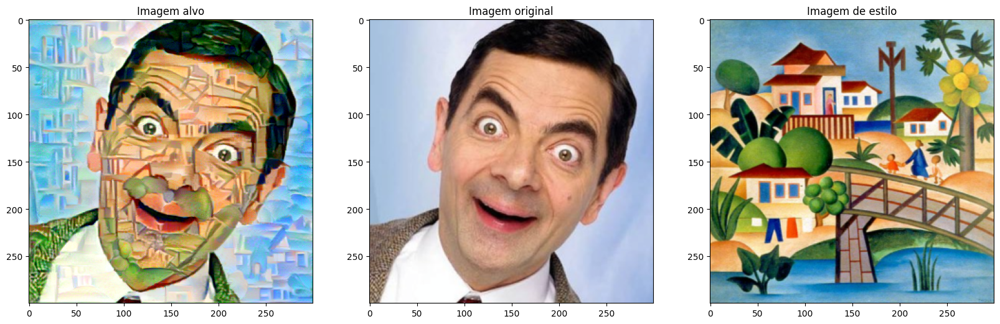

In [49]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (20, 8))
ax1.imshow(show_img(target_img))
ax1.set_title('Imagem alvo')
ax2.imshow(show_img(new_img))
ax2.set_title('Imagem original')
ax3.imshow(show_img(style_img))
ax3.set_title('Imagem de estilo')

In [50]:
# 1. Tira a imagem da "mesa de trabalho" e prepara para virar arquivo
final_img = show_img(target_img) # Usa aquela função que criamos para desnormalizar

# 2. Usa uma biblioteca (como PIL ou Matplotlib) para gravar no disco
plt.imsave("resultado_artistico.jpg", final_img)

In [51]:
# bom para carregar o estilo, fotos com auto retrato

